# Jaired Features Versus OpenCV SIFT Features

The functions from the previous example were put into their own file, so it can now be imported. After calling ExtractSIFT, raw keypoints are displayed on the RGB image, and then keypoints after non-maximal suppression on the RGB image.

Read in 8.jpg. Shape: (453, 604)
1714 keypoints detected.
1714 original keypoints.
817 remaining keypoints after non-maximal suppression.
Read in 9.jpg. Shape: (453, 604)
1635 keypoints detected.
1635 original keypoints.
849 remaining keypoints after non-maximal suppression.


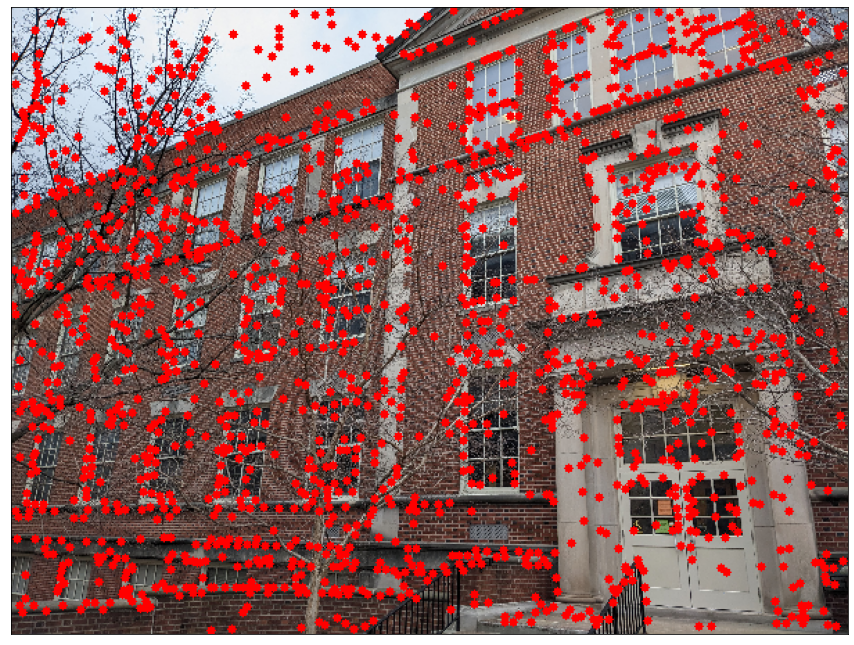

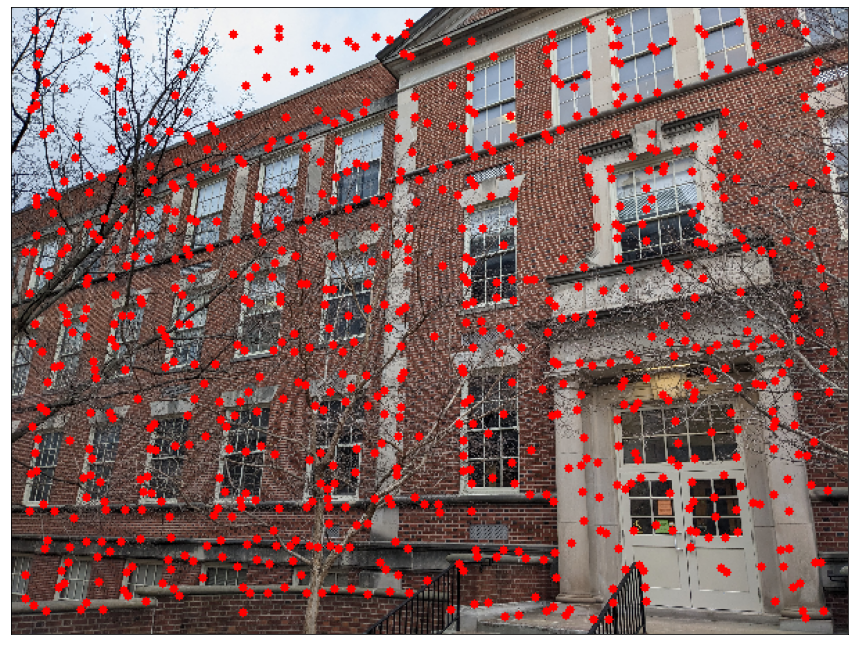

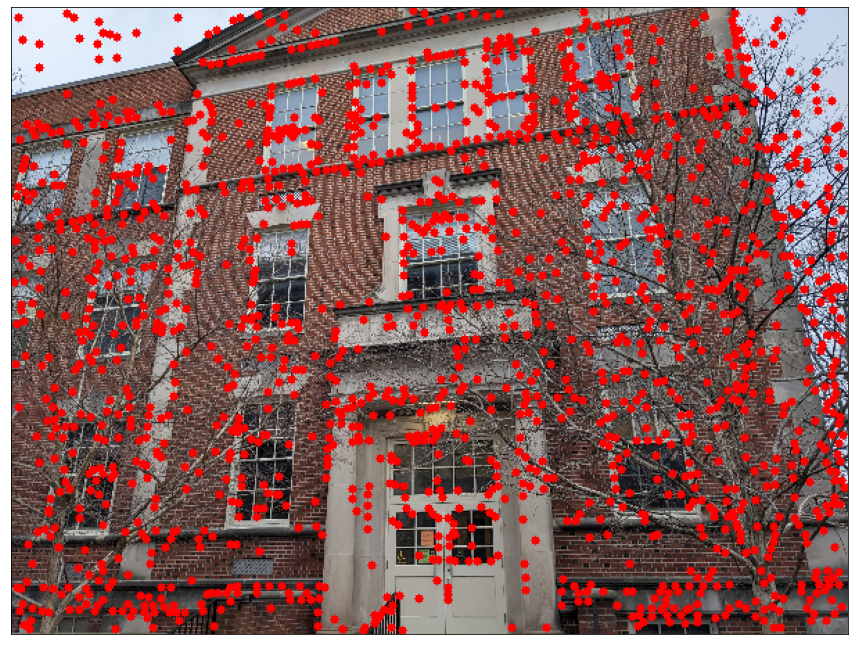

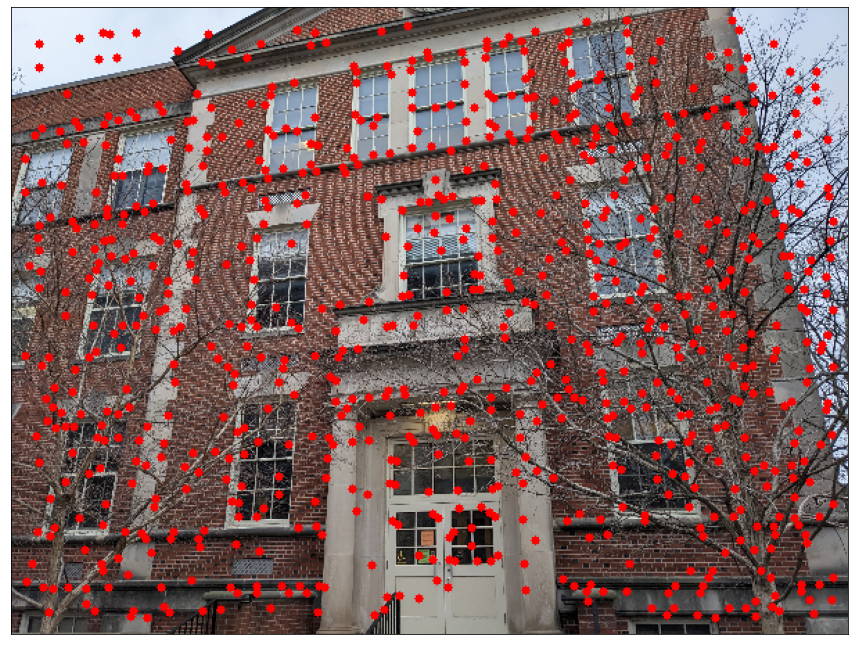

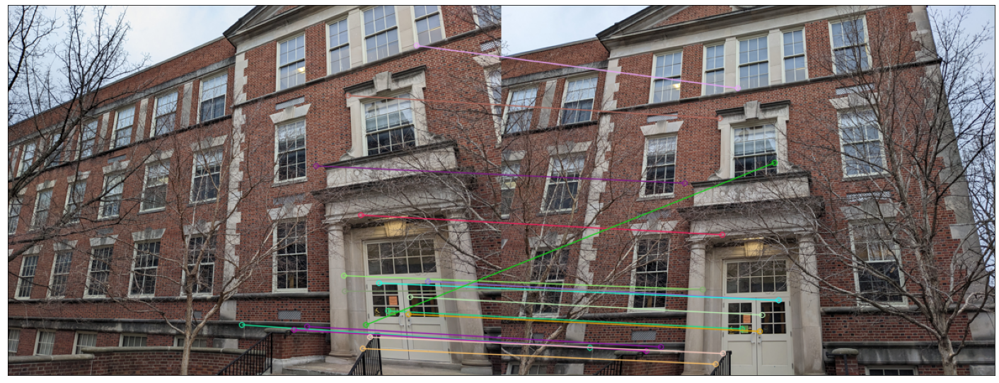

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

import JairedFeatures as Jaired


# Extract Jaired features for two images
left_image_path = "8.jpg"
left_desc, left_img, left_rgb = Jaired.ExtractSIFT(left_image_path, 0.15)

right_image_path = "9.jpg"
right_desc, right_img, right_rgb = Jaired.ExtractSIFT(right_image_path, 0.15)

# Get and display matches
matches = Jaired.Match(left_desc, right_desc, ratio = 0.5)

drawn_matches = cv2.drawMatches(left_rgb, left_desc[0], 
                                right_rgb, right_desc[0], 
                                matches, None,
                                flags=cv2.DRAW_MATCHES_FLAGS_NOT_DRAW_SINGLE_POINTS)
plt.figure(figsize=(25,25))
plt.xticks([])
plt.yticks([])
plt.imshow(drawn_matches)

### OpenCV SIFT
OpenCV has many feature implementations, including SIFT. How does it compare to Jaired features?

In [2]:
# OpenCV uses objects for feature detection and description
sift = cv2.SIFT.create()

# Detect and compute returns both keypoint locations and descriptors.
# You may also use just detection or just computation, so you can mix and match
# keypoint extractors and descriptors.
# The Jaired feature code uses just the compute method of SIFT.
left_kp, left_ds = sift.detectAndCompute(left_img, None)
right_kp, right_ds = sift.detectAndCompute(right_img, None)

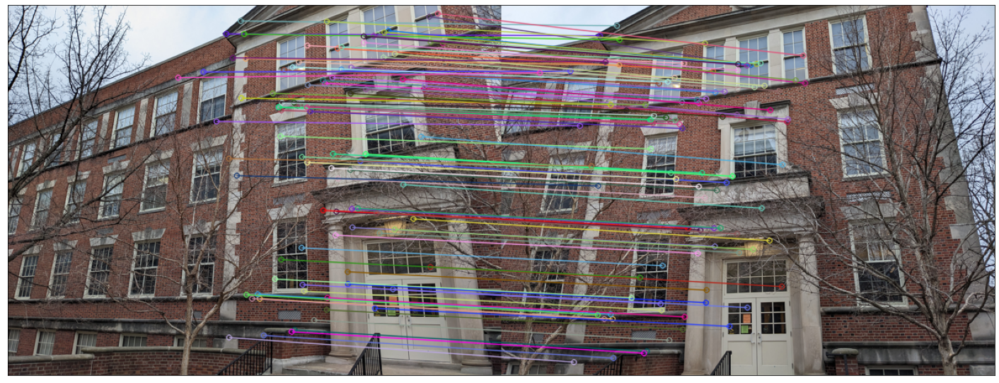

In [3]:
# Number of matches to visualize
numMatches = 100

# OpenCV also has several matchers. The naive case is brute force.
bf = cv2.BFMatcher(cv2.NORM_L2)

# This returns the single best match for each descriptor.
# How would you implement the ratio test with this instead?
matches_cv = bf.match(left_ds, right_ds)

# Sorted matches to show the n best matches
matches_cv = sorted(matches_cv, key = lambda x:x.distance)

cv_matches_img = cv2.drawMatches(left_rgb, left_kp, right_rgb, right_kp, 
                                 matches_cv[:numMatches], None, 
                                 flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(25,25))
plt.xticks([])
plt.yticks([])
plt.imshow(cv_matches_img)